# Проект по курсу DS-prof-2022-08 OTUS на тему
## "Прогнозирование электропотребления предприятия с применением искусственных нейронных сетей"

## Аннотация
Актуальность обусловлена необходимостью исследование возможности применения методов искусственного интеллекта для краткосрочного прогнозирования электропотребления групп точек поставки электроэнергии предприятиям. С целью применения таких методов в помощь к экспертному прогнозированию. 

## Основная идея: 
 - Почасовое потребление электрической энергии представляет собой временной ряд, с частотой 1 час
 - Провести анализ временного ряда
 - Определить методы прогнозирования временных рядов
 - Создать модель прогнозирования
 - Спрогнозировать
 - Оценить результаты

## Описание исходных данных
Почасовое потребление электрической энергии представлено 
- за период с 2018 по июнь 2023 г.;
- в разерезе точек поставки;
- в разрезе дата-время

## Описание результата
Результаты данного прогноза используются предприятием для подачи заявки на рынок на сутки вперед оптового рынка электрической энергии. Ошибки прогнозирования приводят к увеличению объёма обращения электрической энергии на балансирующем рынке, и как следствие к увеличению конечной цены на электрическую энергию.

### Цель
- Применение DL к прогозирванию почасвого потребления электрической энергии

# Код

In [1]:
# Импорты
import pathlib
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import phik

import random

import torch
import torch.nn as nn

import tqdm

## Предварительные преобразования и проверки
### Сделано в отдельном ноутбуке
 - сформировать список исходых файлов
 - проверить, что во всех исходных файлах есть лист "'Данные эл.эн.'". В листе "'Данные эл.эн.'" хранятся почасвые расходы электоэнергии по точкам поставки
 - объединить точки поставки (ТП) по годам и найти перечень всех ТП за период с 2019 - 2023 гг
 - добавить привязки ТП - Объект - группа точек поставки (ГТП)
  
### Сделано в этом ноутбуке 
 - получить дата-фрейм для ГТП-ВС: колонка "дата-время", колонка "почасовые расходы"
 - получить дата-фрейм для ГТП-ВО: колонка дата-время, колонка "почасовые расходы"
 - проверить данные

In [2]:
path_files = Path('Форма ППП')
path_files = path_files.resolve()
file = 'Форма ППП.xlsx'
file = Path(path_files, file)

In [3]:
xl = pd.ExcelFile(file)
print(xl.sheet_names)

['2019-2023_ГТП']


In [4]:
data = xl.parse('2019-2023_ГТП')

In [5]:
df_ee = data.copy()

In [6]:
df_ee = df_ee.drop(index = df_ee.loc[df_ee['Дата время (мск)'] == '2023-06-30 00:00:00'].index)

In [7]:
df_ee

,Дата время (мск),ГТП_ВС,ГТП_ВО
0,2019-01-01 00:00:00,6344.080,8562.00
1,2019-01-01 01:00:00,6311.008,8170.24
2,2019-01-01 02:00:00,6345.960,7837.36
3,2019-01-01 03:00:00,6190.032,7835.24
4,2019-01-01 04:00:00,6354.032,7821.12
...,...,...,...
39379,2023-06-29 19:00:00,7132.000,6772.00
39380,2023-06-29 20:00:00,7058.000,6860.00
39381,2023-06-29 21:00:00,6967.000,7041.00
39382,2023-06-29 22:00:00,6265.000,6772.00


In [8]:
df_ee['Дата время (мск)'].drop_duplicates()

0       2019-01-01 00:00:00
1       2019-01-01 01:00:00
2       2019-01-01 02:00:00
3       2019-01-01 03:00:00
4       2019-01-01 04:00:00
                ...        
39379   2023-06-29 19:00:00
39380   2023-06-29 20:00:00
39381   2023-06-29 21:00:00
39382   2023-06-29 22:00:00
39383   2023-06-29 23:00:00
Name: Дата время (мск), Length: 39384, dtype: datetime64[ns]

In [9]:
df_ee_eda = df_ee.copy()

In [10]:
df_ee_eda = df_ee_eda.set_index('Дата время (мск)')
df_ee_eda['Дата время']  = df_ee_eda.index

## EDA. PREPROCESSING

In [11]:
df_ee_eda.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39384 entries, 2019-01-01 00:00:00 to 2023-06-29 23:00:00
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ГТП_ВС      39384 non-null  float64       
 1   ГТП_ВО      39384 non-null  float64       
 2   Дата время  39384 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2)
memory usage: 1.2 MB


In [12]:
df_ee_eda

,ГТП_ВС,ГТП_ВО,Дата время
Дата время (мск),,,
2019-01-01 00:00:00,6344.080,8562.00,2019-01-01 00:00:00
2019-01-01 01:00:00,6311.008,8170.24,2019-01-01 01:00:00
2019-01-01 02:00:00,6345.960,7837.36,2019-01-01 02:00:00
2019-01-01 03:00:00,6190.032,7835.24,2019-01-01 03:00:00
2019-01-01 04:00:00,6354.032,7821.12,2019-01-01 04:00:00
...,...,...,...
2023-06-29 19:00:00,7132.000,6772.00,2023-06-29 19:00:00
2023-06-29 20:00:00,7058.000,6860.00,2023-06-29 20:00:00
2023-06-29 21:00:00,6967.000,7041.00,2023-06-29 21:00:00


In [13]:
gtp = 'ГТП_ВС'

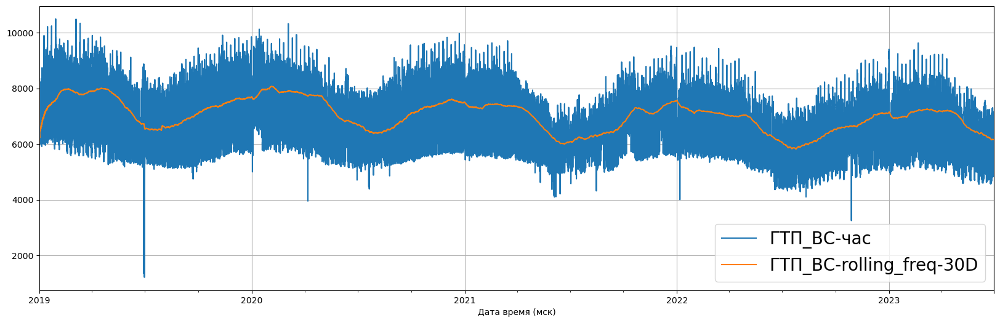

In [14]:
df_ee_eda[[gtp, 'Дата время']].plot(x = 'Дата время', figsize = (20,6), grid = True)
rolling_freq = '30D'
df_ee_eda[gtp].rolling(rolling_freq).mean().plot(x = 'Дата время', figsize = (20,6), grid = True)
plt.legend(labels=[f'{gtp}-час', f'{gtp}-rolling_freq-{rolling_freq}'],fontsize=20)

### похоже на выброс.

In [15]:
df_ee_eda

,ГТП_ВС,ГТП_ВО,Дата время
Дата время (мск),,,
2019-01-01 00:00:00,6344.080,8562.00,2019-01-01 00:00:00
2019-01-01 01:00:00,6311.008,8170.24,2019-01-01 01:00:00
2019-01-01 02:00:00,6345.960,7837.36,2019-01-01 02:00:00
2019-01-01 03:00:00,6190.032,7835.24,2019-01-01 03:00:00
2019-01-01 04:00:00,6354.032,7821.12,2019-01-01 04:00:00
...,...,...,...
2023-06-29 19:00:00,7132.000,6772.00,2023-06-29 19:00:00
2023-06-29 20:00:00,7058.000,6860.00,2023-06-29 20:00:00
2023-06-29 21:00:00,6967.000,7041.00,2023-06-29 21:00:00


In [16]:
gtp = 'ГТП_ВС'
df_ee_eda.loc[df_ee_eda[gtp] < 4000]

,ГТП_ВС,ГТП_ВО,Дата время
Дата время (мск),,,
2019-06-29 00:00:00,1354.696,6393.00,2019-06-29 00:00:00
2019-06-29 20:00:00,2200.016,7839.48,2019-06-29 20:00:00
2019-06-29 21:00:00,1387.016,7917.48,2019-06-29 21:00:00
2019-06-29 22:00:00,1375.344,7108.48,2019-06-29 22:00:00
2019-06-29 23:00:00,1369.960,6903.24,2019-06-29 23:00:00
2019-06-30 01:00:00,1278.624,6302.52,2019-06-30 01:00:00
2019-06-30 02:00:00,1428.440,6360.52,2019-06-30 02:00:00
2019-06-30 03:00:00,1627.040,6398.52,2019-06-30 03:00:00
2019-06-30 04:00:00,1536.016,6062.64,2019-06-30 04:00:00


### заменю средним значением за этот месяц. этого года, аналогичного часа

In [17]:
for index in df_ee_eda.loc[df_ee_eda[gtp] < 4000].index:
    df_ee_eda.loc[index, gtp] = df_ee_eda.loc[(df_ee_eda['Дата время'].dt.year == df_ee_eda.loc[index]['Дата время'].year)&
                                           (df_ee_eda['Дата время'].dt.month == df_ee_eda.loc[index]['Дата время'].month)&
                                           (df_ee_eda['Дата время'].dt.hour == df_ee_eda.loc[index]['Дата время'].hour)&
                                           (df_ee_eda[gtp] > 4000), gtp].median()

замена прошла успешно

### EDA

In [18]:
df_ee_eda.describe()

,ГТП_ВС,ГТП_ВО
count,39384.000000,39384.000000
mean,7025.898740,7667.255423
std,1067.284958,989.238861
min,4000.000000,4030.000000
25%,6208.000000,6969.000000
50%,7004.000000,7612.000000
75%,7844.898000,8291.000000
max,10493.112000,12312.840000


In [19]:
gtp = 'ГТП_ВС'

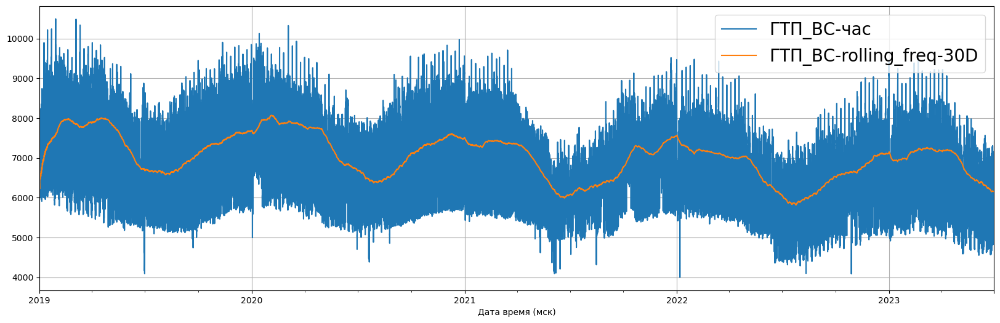

In [20]:
df_ee_eda[[gtp, 'Дата время']].plot(x = 'Дата время', figsize = (20,6), grid = True)
rolling_freq = '30D'
df_ee_eda[gtp].rolling(rolling_freq).mean().plot(x = 'Дата время', figsize = (20,6), grid = True)
plt.legend(labels=[f'{gtp}-час', f'{gtp}-rolling_freq-{rolling_freq}'],fontsize=20)

In [21]:
gtp = 'ГТП_ВО'

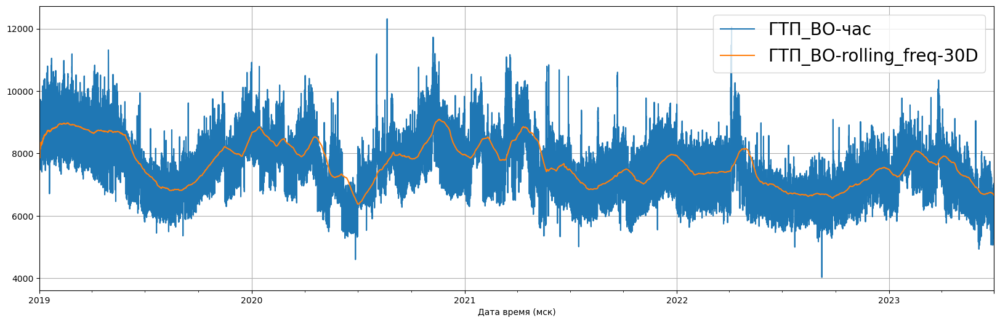

In [22]:
df_ee_eda[[gtp, 'Дата время']].plot(x = 'Дата время', figsize = (20,6), grid = True)
rolling_freq = '30D'
df_ee_eda[gtp].rolling(rolling_freq).mean().plot(x = 'Дата время', figsize = (20,6), grid = True)
plt.legend(labels=[f'{gtp}-час', f'{gtp}-rolling_freq-{rolling_freq}'],fontsize=20)

In [23]:
col = 'Дата время'
df_ee_eda_mean = df_ee_eda.groupby([df_ee_eda[col].dt.year, df_ee_eda[col].dt.hour])[['ГТП_ВС', 'ГТП_ВО']].mean()

In [24]:
gtp = 'ГТП_ВС'

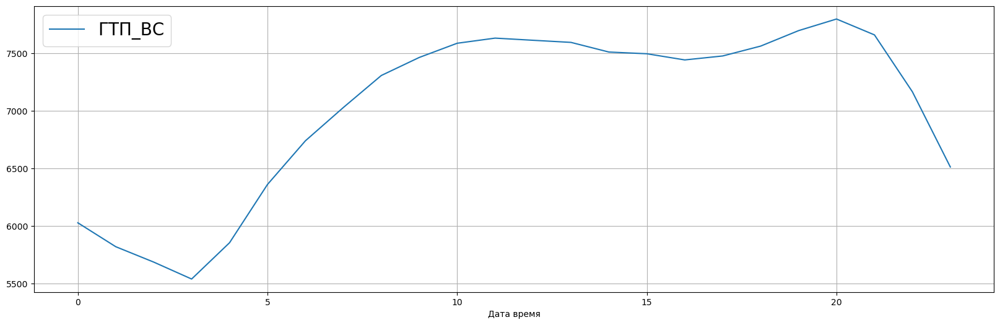

In [25]:
df_ee_eda.groupby([df_ee_eda['Дата время'].dt.hour])[gtp].mean().plot(x = 'Дата время', figsize = (20,6), grid = True)
plt.legend(fontsize=20)

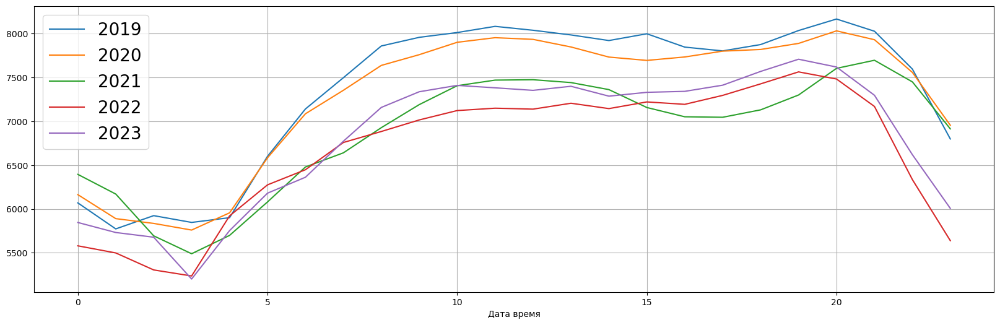

In [26]:
for ind in range(2019, 2024):
    df_ee_eda_mean.loc[(ind)][gtp].plot(x = 'Дата время', figsize = (20,6), grid = True)
    plt.legend(list(range(2019, 2024)), fontsize=20)

In [27]:
gtp = 'ГТП_ВО'

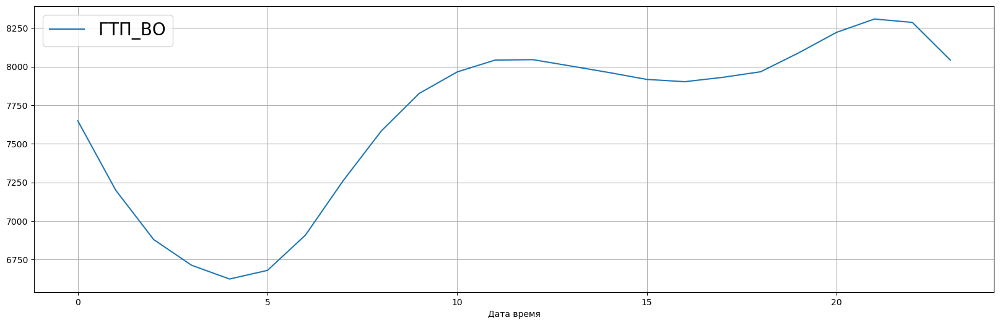

In [28]:
df_ee_eda.groupby([df_ee_eda['Дата время'].dt.hour])[gtp].mean().plot(x = 'Дата время', figsize = (20,6), grid = True)
plt.legend(fontsize=20)

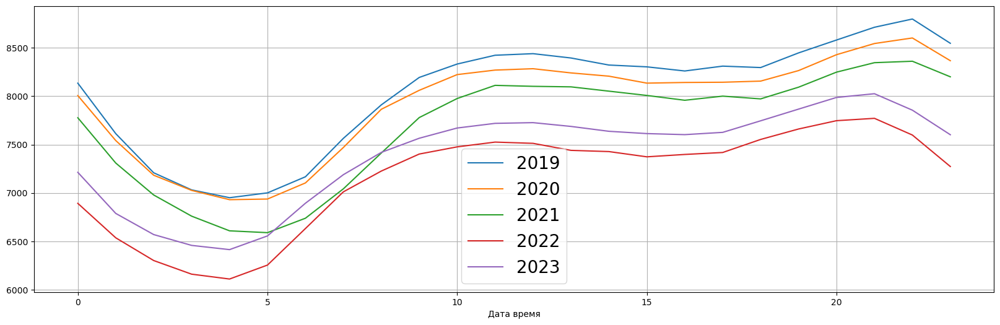

In [29]:
for ind in range(2019, 2024):
    df_ee_eda_mean.loc[(ind)][gtp].plot(x = 'Дата время', figsize = (20,6), grid = True)
    plt.legend(list(range(2019, 2024)), fontsize=20)

## Вывод 
1. данные собраны 
2. выбросов нет
3. основные метрики просмотрены
4. можно приступать к модедированию

## Дополнительные исследования: посмотрим как меняются профиль расхода электроэнергии за каждый час

In [30]:
df_ee_eda

,ГТП_ВС,ГТП_ВО,Дата время
Дата время (мск),,,
2019-01-01 00:00:00,6344.080,8562.00,2019-01-01 00:00:00
2019-01-01 01:00:00,6311.008,8170.24,2019-01-01 01:00:00
2019-01-01 02:00:00,6345.960,7837.36,2019-01-01 02:00:00
2019-01-01 03:00:00,6190.032,7835.24,2019-01-01 03:00:00
2019-01-01 04:00:00,6354.032,7821.12,2019-01-01 04:00:00
...,...,...,...
2023-06-29 19:00:00,7132.000,6772.00,2023-06-29 19:00:00
2023-06-29 20:00:00,7058.000,6860.00,2023-06-29 20:00:00
2023-06-29 21:00:00,6967.000,7041.00,2023-06-29 21:00:00


In [31]:
gtp = 'ГТП_ВС'

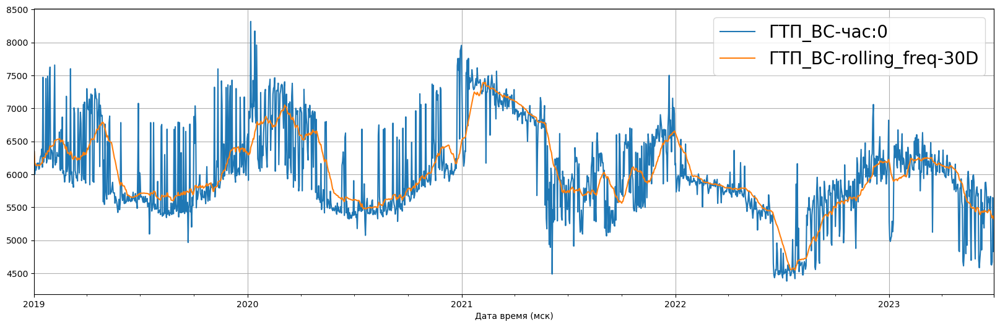

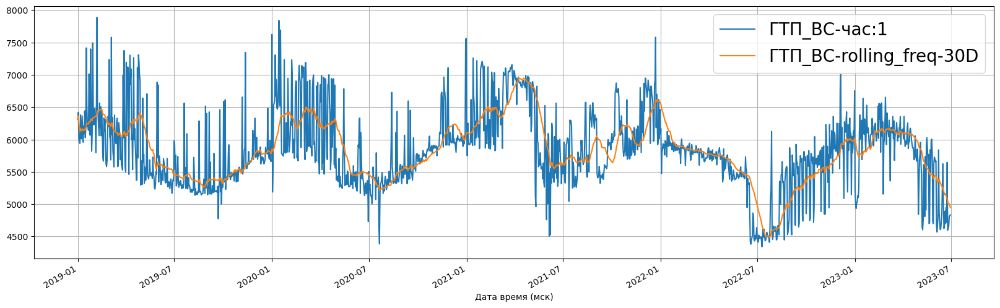

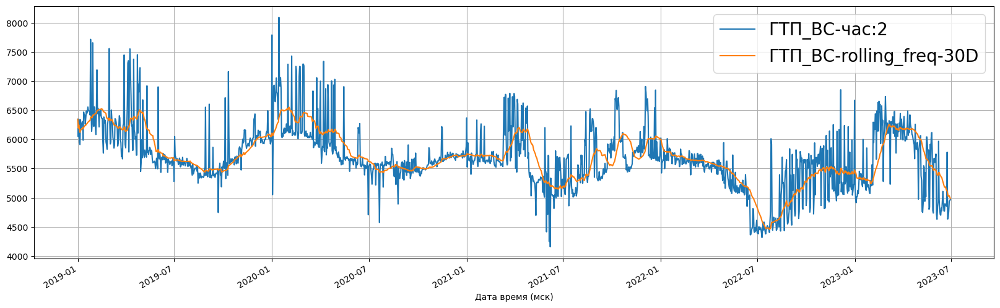

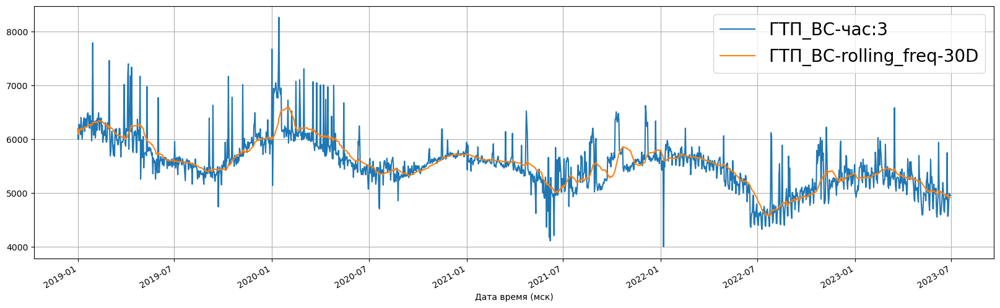

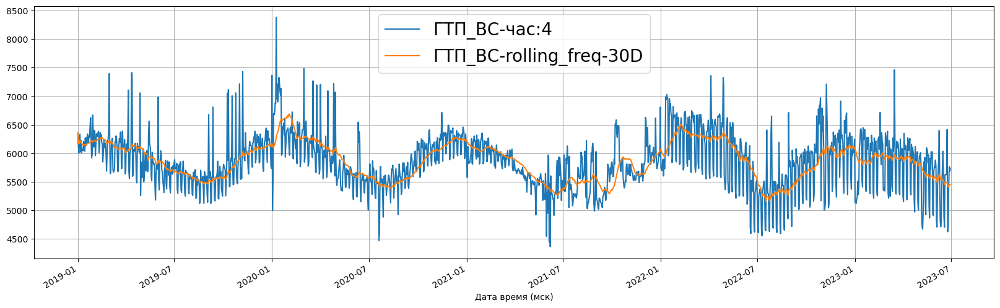

...

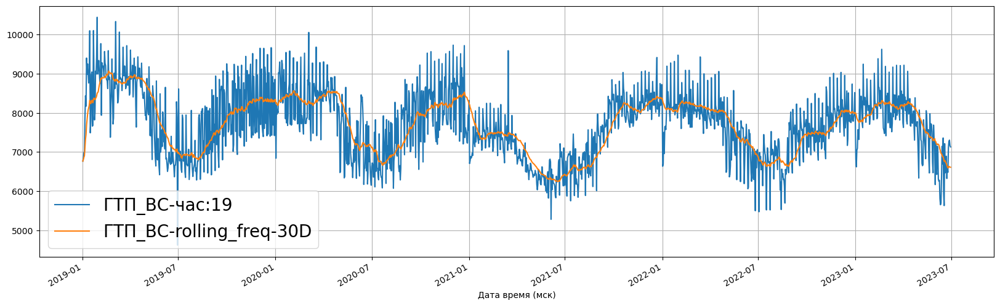

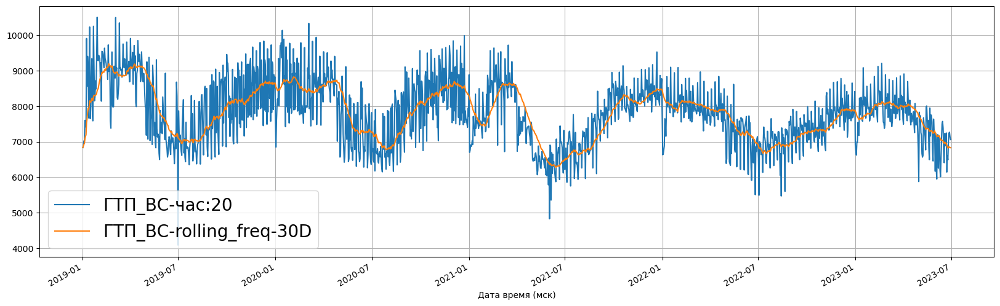

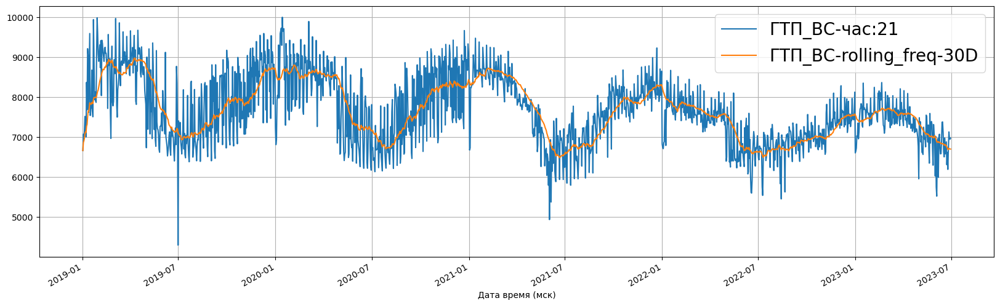

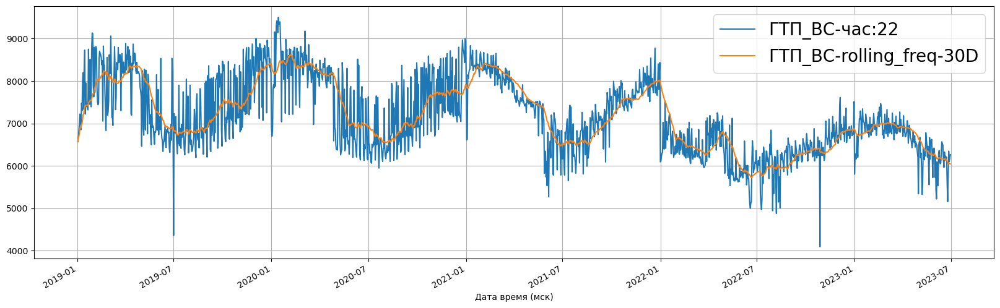

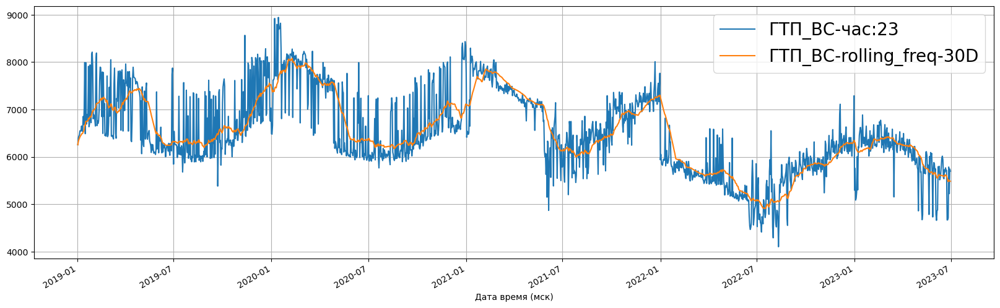

In [32]:
for el in range(0,24):
    fig, ax = plt.subplots()
    df_ee_eda_hour = df_ee_eda.loc[df_ee_eda['Дата время'].dt.hour == el][gtp]
    df_ee_eda_hour.plot(figsize = (20,6), grid = True, ax = ax)
    #leg = f"{gtp} - час: {el}"
    rolling_freq = '30D'
    df_ee_eda_hour.rolling(rolling_freq).mean().plot(figsize = (20,6), grid = True)    
    plt.legend(labels=[f'{gtp}-час:{el}', f'{gtp}-rolling_freq-{rolling_freq}'],fontsize=20)
    plt.show()

C:\Users\smndy\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


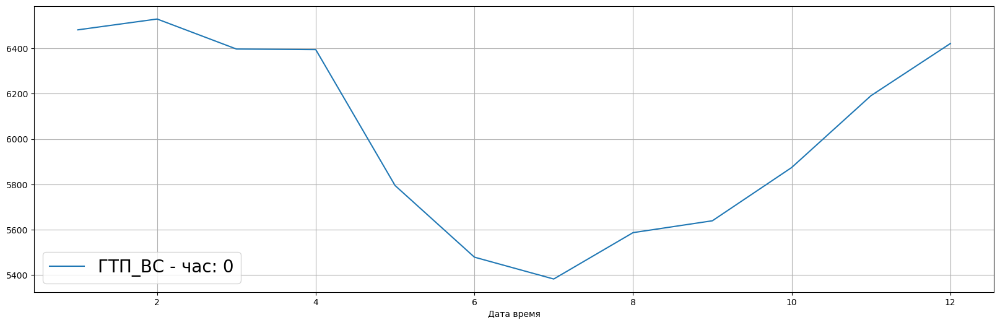

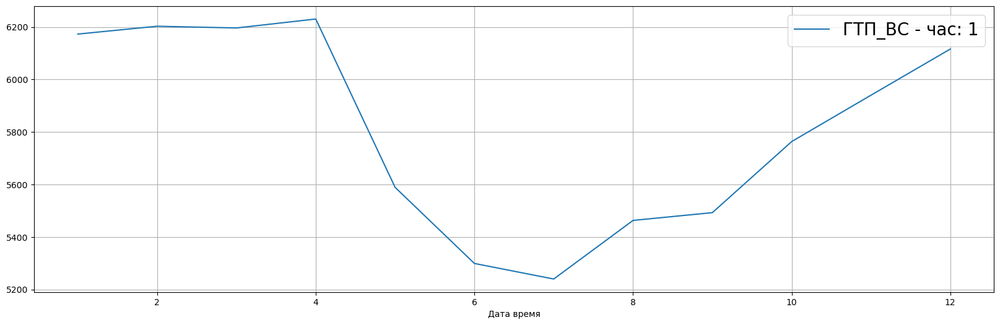

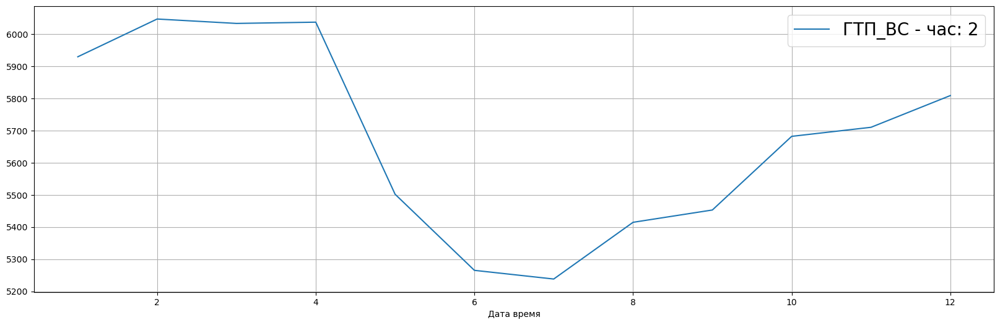

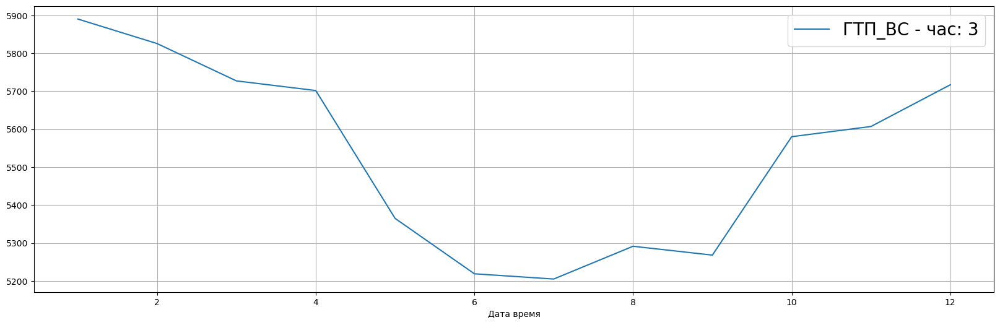

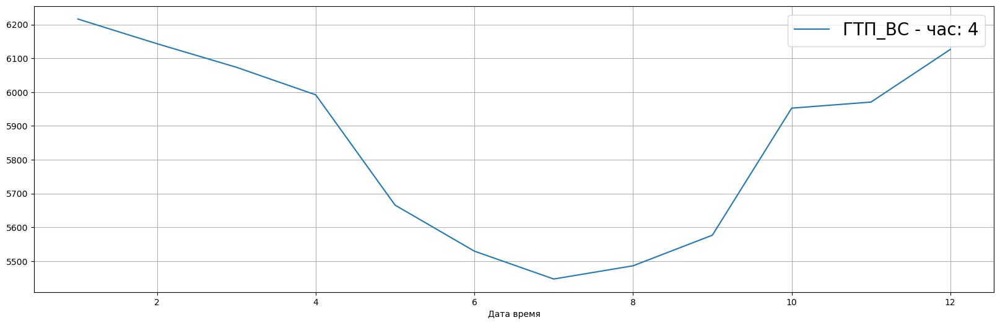

...

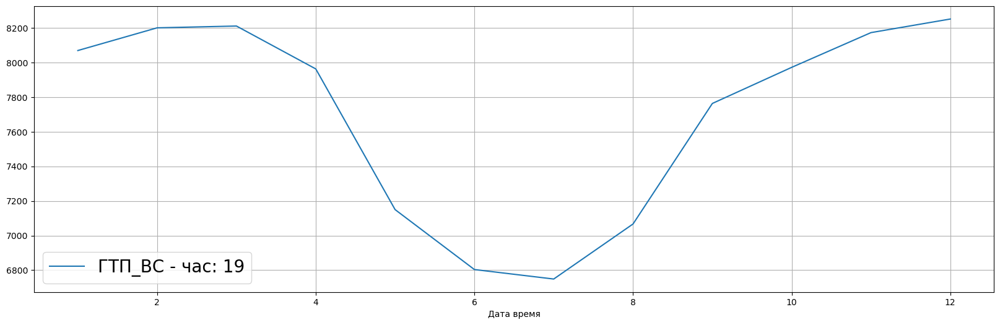

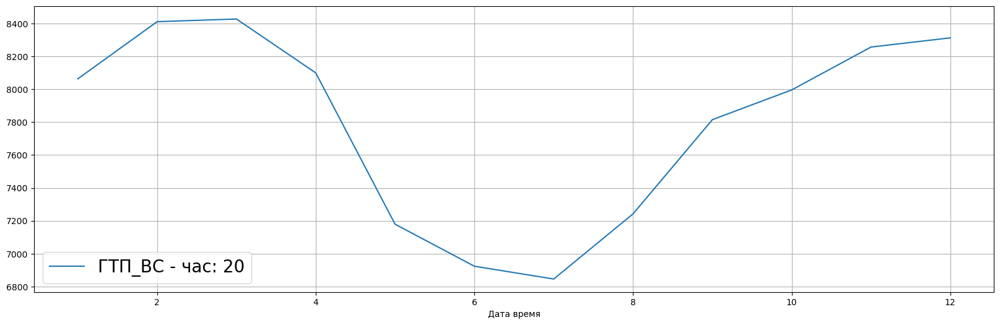

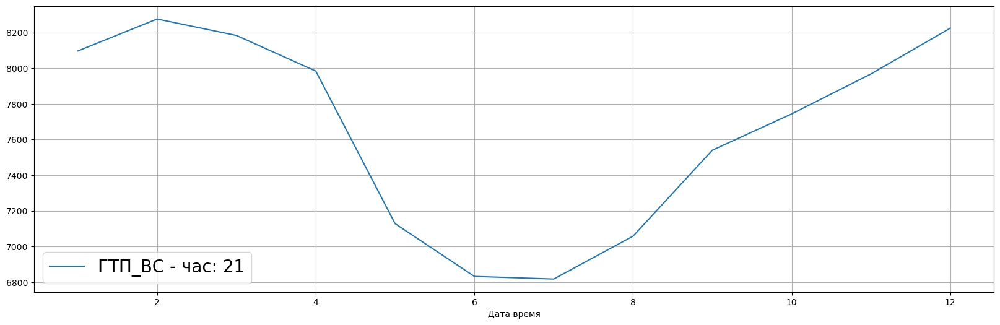

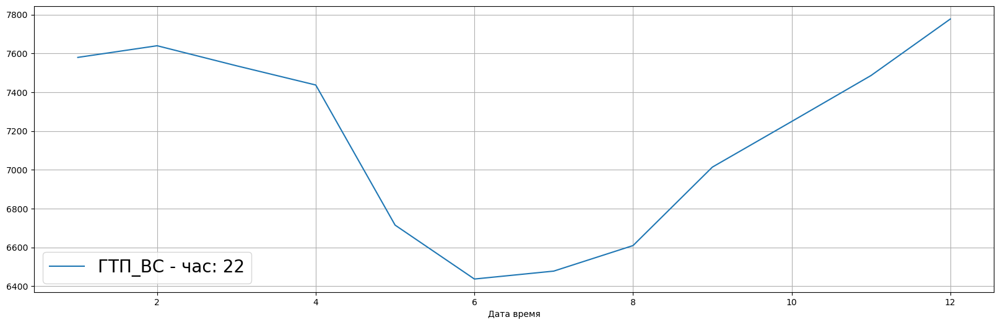

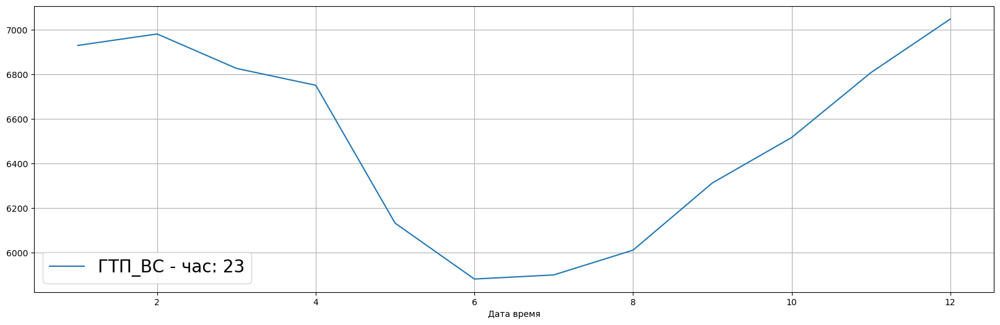

In [33]:
for el in range(0,24):
    df_ee_el = df_ee_eda.loc[df_ee_eda['Дата время'].dt.hour == el][[gtp, 'Дата время']]
    df_ee_el.groupby([df_ee_el['Дата время'].dt.month])[[gtp]].mean().plot(figsize = (20,6), grid = True)
    leg = f"{gtp} - час: {el}"
    plt.legend(labels=[leg], fontsize=20)

In [34]:
gtp = 'ГТП_ВО'

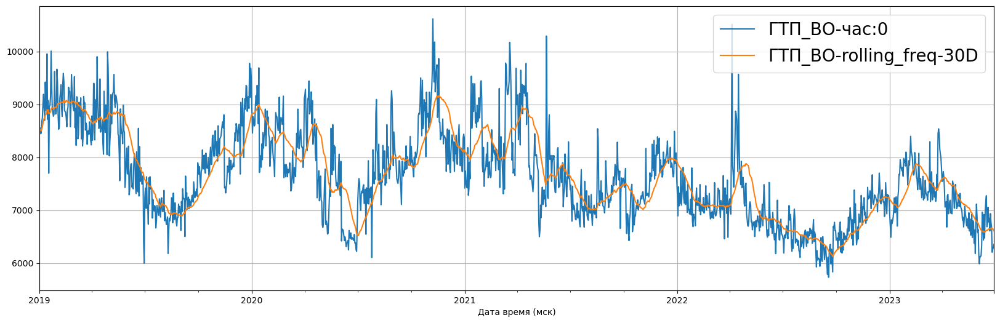

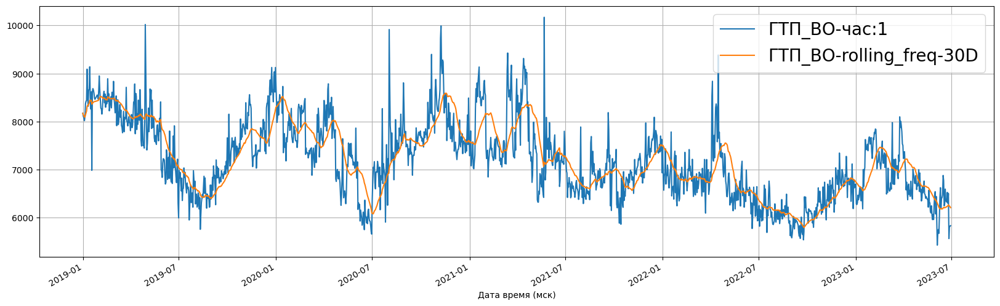

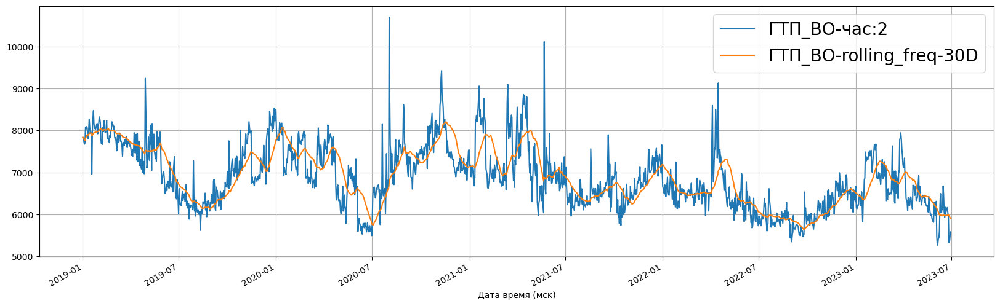

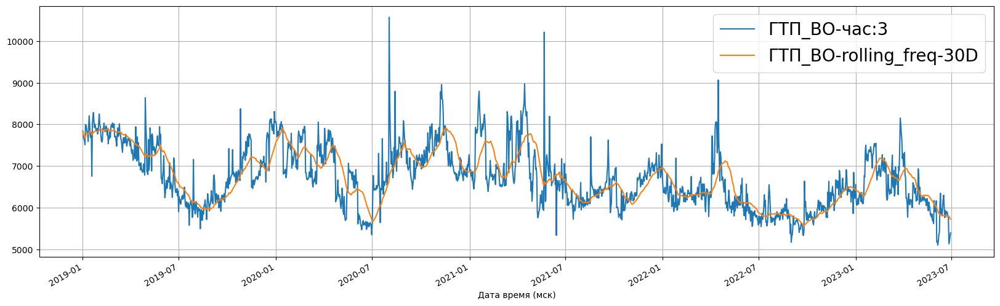

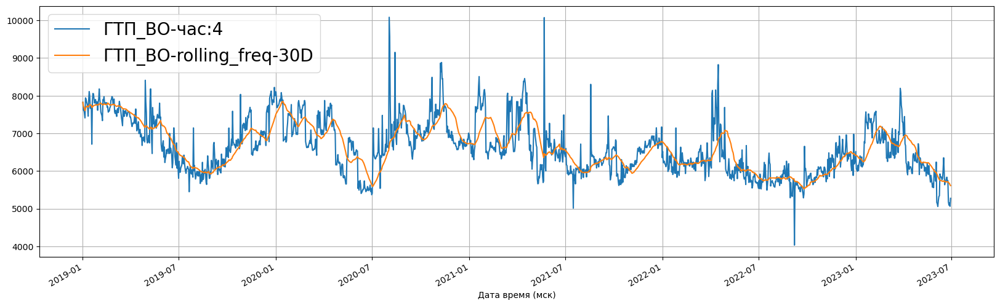

...

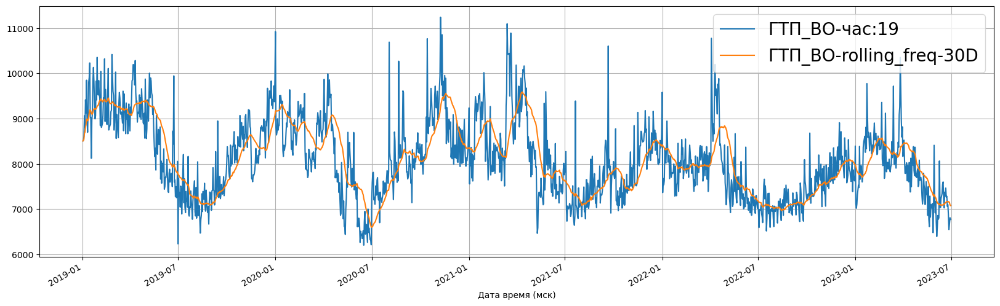

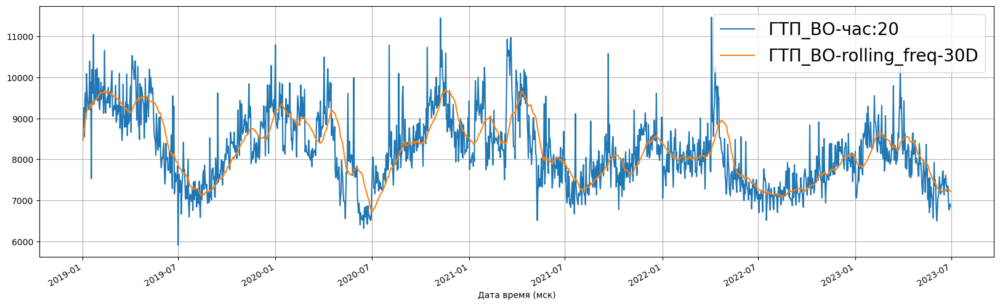

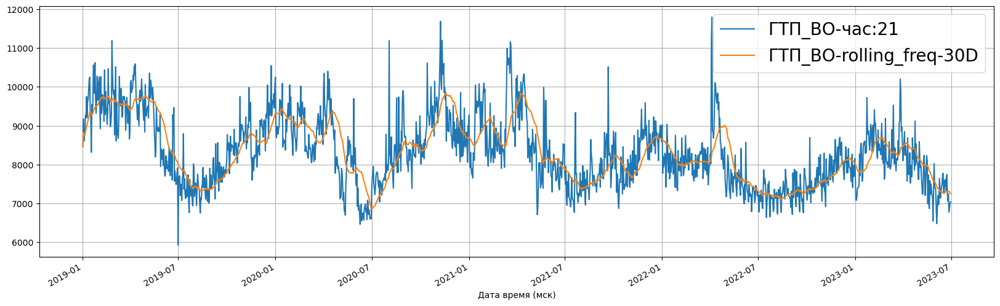

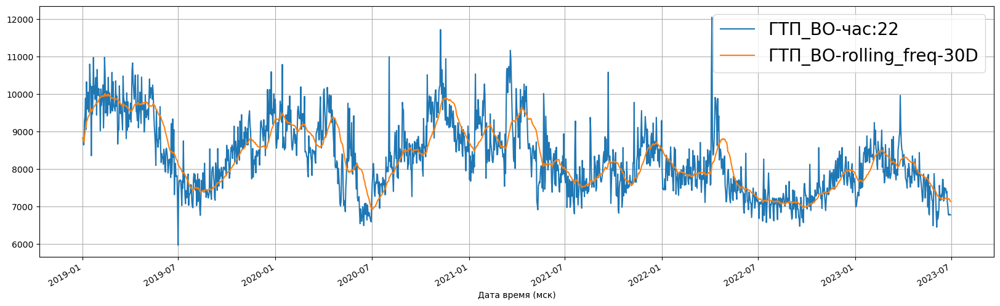

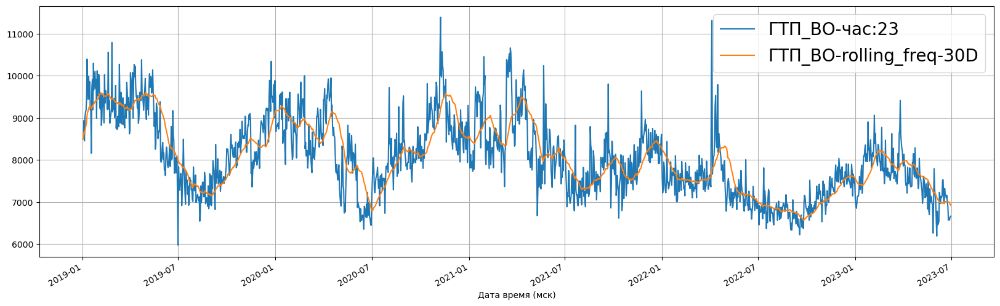

In [35]:
for el in range(0,24):
    fig, ax = plt.subplots()
    df_ee_eda_hour = df_ee_eda.loc[df_ee_eda['Дата время'].dt.hour == el][gtp]
    df_ee_eda_hour.plot(figsize = (20,6), grid = True, ax = ax)
    rolling_freq = '30D'
    df_ee_eda_hour.rolling(rolling_freq).mean().plot(figsize = (20,6), grid = True)    
    plt.legend(labels=[f'{gtp}-час:{el}', f'{gtp}-rolling_freq-{rolling_freq}'],fontsize=20)
    plt.show()

C:\Users\smndy\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


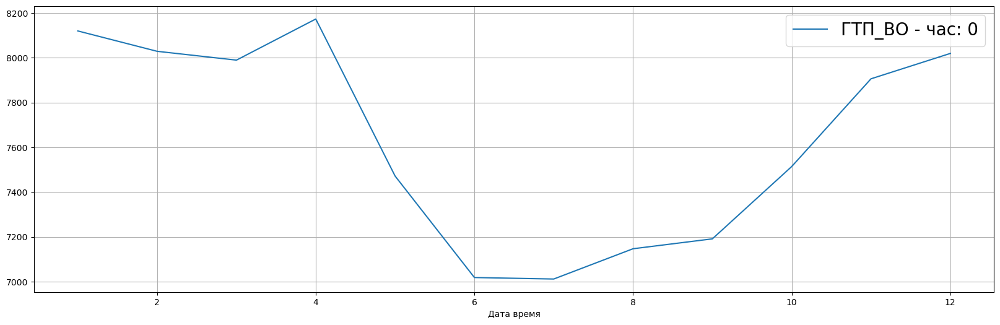

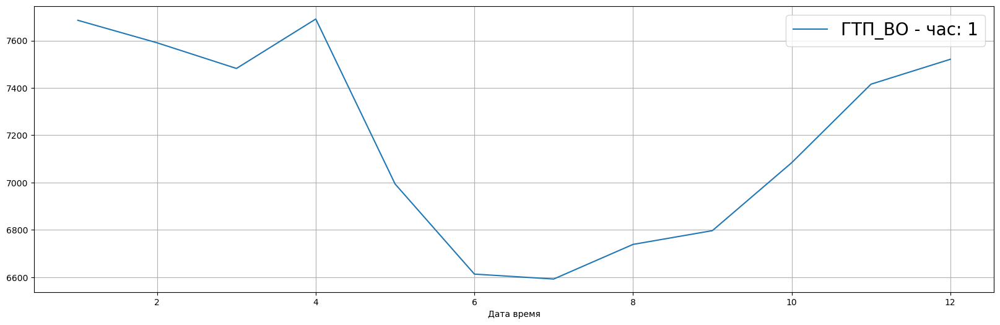

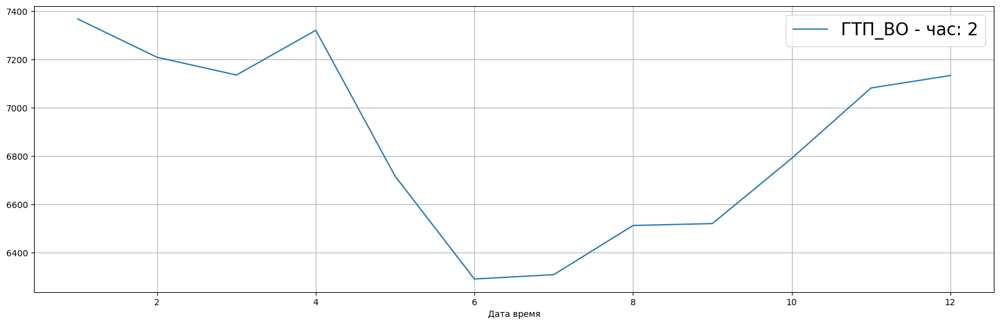

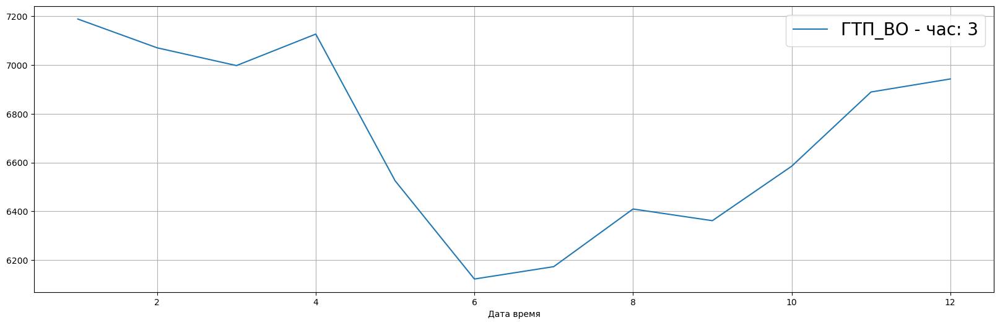

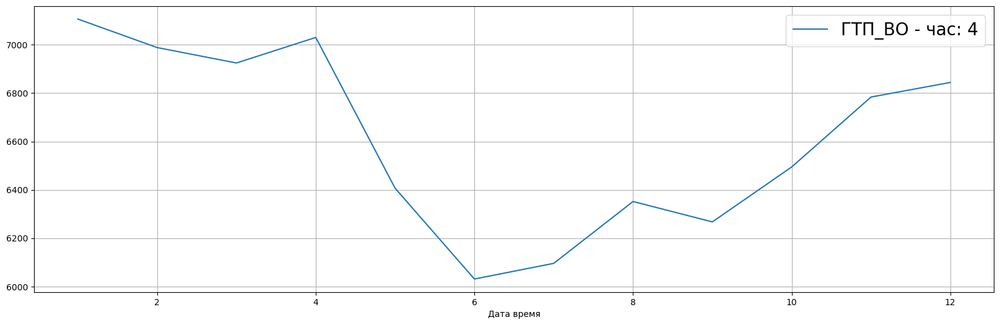

...

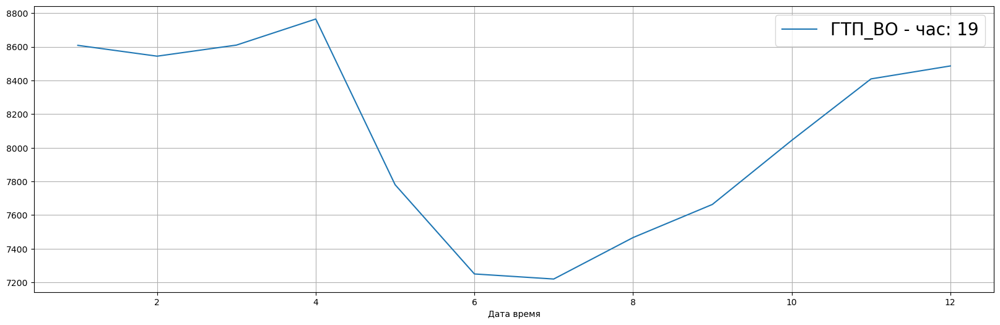

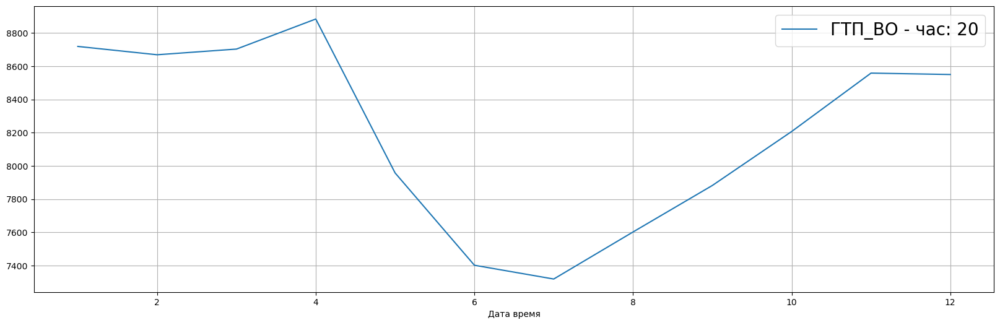

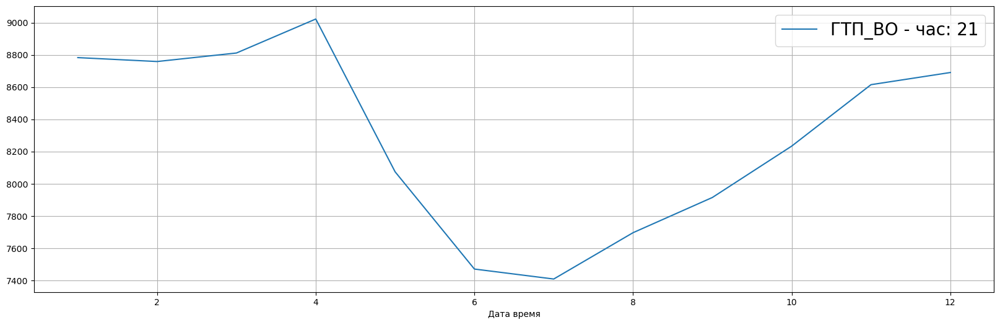

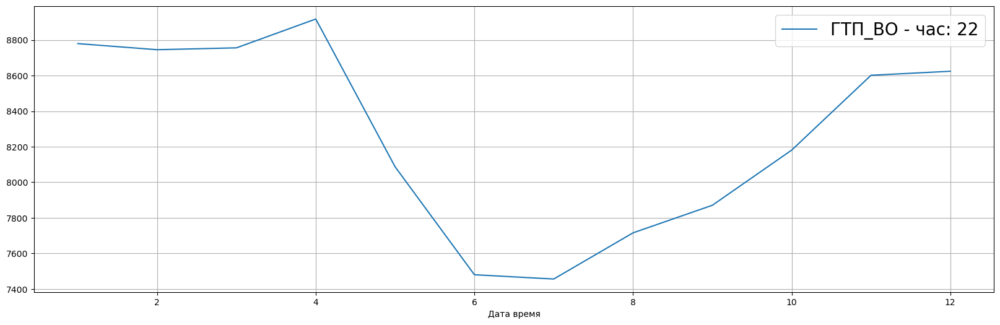

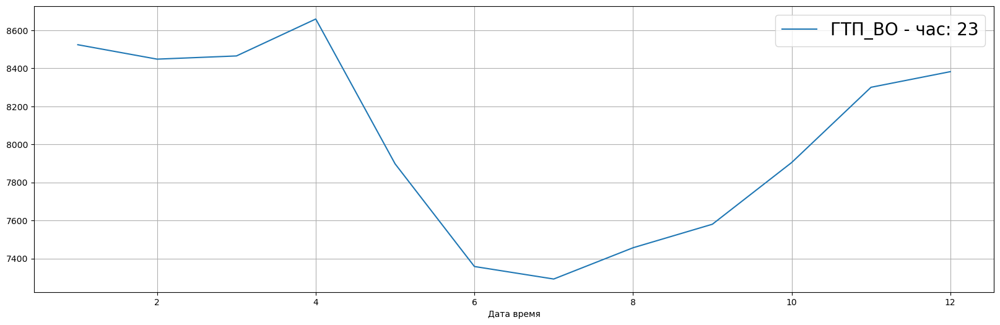

In [36]:
for el in range(0,24):
    df_ee_el = df_ee_eda.loc[df_ee_eda['Дата время'].dt.hour == el][[gtp, 'Дата время']]
    df_ee_el.groupby([df_ee_el['Дата время'].dt.month])[[gtp]].mean().plot(figsize = (20,6), grid = True)
    leg = f"{gtp} - час: {el}"
    plt.legend(labels=[leg], fontsize=20)

# Моделирование

т.к. прогнозирую сразу одни сутки, а в сутках 24 значения, то за основу возьму RNN интервальное прогнозирование

Базовая модель прогноз на сутки вперед равен аналогичному дню неделю назад

Гипотеза: прогнозирование с помощью ИИ должно быть лучше чем базовая модель

### оценка модели проводится по бизнес-метрике, БМ: БМ = (сумма[(Ф - Откл_abs)/П])/N, где
    Ф - фактический расход электрической энергии за час;
    П - плановый расход электрической энергии за час;
    Откл_abs = |Ф - П| отклонение фактического расхода за час от планового расхода за час
    N - число плановых значений за месяц.
#### Цель: БМ должна быть не более 4% за месяц.

## Создание базовой модели: прогноз на сутки равен аналогичному дню неделю назад

In [37]:
df_ee

,Дата время (мск),ГТП_ВС,ГТП_ВО
0,2019-01-01 00:00:00,6344.080,8562.00
1,2019-01-01 01:00:00,6311.008,8170.24
2,2019-01-01 02:00:00,6345.960,7837.36
3,2019-01-01 03:00:00,6190.032,7835.24
4,2019-01-01 04:00:00,6354.032,7821.12
...,...,...,...
39379,2023-06-29 19:00:00,7132.000,6772.00
39380,2023-06-29 20:00:00,7058.000,6860.00
39381,2023-06-29 21:00:00,6967.000,7041.00
39382,2023-06-29 22:00:00,6265.000,6772.00


### Создание базовой модели: прогноз на сутки равен аналогичному дню неделю назад

In [38]:
df_ee_base = df_ee.copy()

In [39]:
df_ee_base = df_ee_base.set_index('Дата время (мск)')
df_ee_base['Дата время']  = df_ee_base.index

In [40]:
df_ee_base

,ГТП_ВС,ГТП_ВО,Дата время
Дата время (мск),,,
2019-01-01 00:00:00,6344.080,8562.00,2019-01-01 00:00:00
2019-01-01 01:00:00,6311.008,8170.24,2019-01-01 01:00:00
2019-01-01 02:00:00,6345.960,7837.36,2019-01-01 02:00:00
2019-01-01 03:00:00,6190.032,7835.24,2019-01-01 03:00:00
2019-01-01 04:00:00,6354.032,7821.12,2019-01-01 04:00:00
...,...,...,...
2023-06-29 19:00:00,7132.000,6772.00,2023-06-29 19:00:00
2023-06-29 20:00:00,7058.000,6860.00,2023-06-29 20:00:00
2023-06-29 21:00:00,6967.000,7041.00,2023-06-29 21:00:00


In [41]:
# посмотрю если взять 7*24 часов назад
df_ee_base[['ГТП_ВС', 'Дата время']].shift(7*24) #7*24 = числу часов 7 дней назад

,ГТП_ВС,Дата время
Дата время (мск),,
2019-01-01 00:00:00,NaN,NaT
2019-01-01 01:00:00,NaN,NaT
2019-01-01 02:00:00,NaN,NaT
2019-01-01 03:00:00,NaN,NaT
2019-01-01 04:00:00,NaN,NaT
...,...,...
2023-06-29 19:00:00,6325.0,2023-06-22 19:00:00
2023-06-29 20:00:00,6145.0,2023-06-22 20:00:00
2023-06-29 21:00:00,6301.0,2023-06-22 21:00:00


In [42]:
df_ee_base['Дата время_base'] = df_ee_base['Дата время'].shift(7*24)
df_ee_base['ГТП_ВС_base'] = df_ee_base['ГТП_ВС'].shift(7*24)
df_ee_base['ГТП_ВО_base'] = df_ee_base['ГТП_ВО'].shift(7*24)

In [43]:
df_ee_base

,ГТП_ВС,ГТП_ВО,Дата время,Дата время_base,ГТП_ВС_base,ГТП_ВО_base
Дата время (мск),,,,,,
2019-01-01 00:00:00,6344.080,8562.00,2019-01-01 00:00:00,NaT,NaN,NaN
2019-01-01 01:00:00,6311.008,8170.24,2019-01-01 01:00:00,NaT,NaN,NaN
2019-01-01 02:00:00,6345.960,7837.36,2019-01-01 02:00:00,NaT,NaN,NaN
2019-01-01 03:00:00,6190.032,7835.24,2019-01-01 03:00:00,NaT,NaN,NaN
2019-01-01 04:00:00,6354.032,7821.12,2019-01-01 04:00:00,NaT,NaN,NaN
...,...,...,...,...,...,...
2023-06-29 19:00:00,7132.000,6772.00,2023-06-29 19:00:00,2023-06-22 19:00:00,6325.0,7282.0
2023-06-29 20:00:00,7058.000,6860.00,2023-06-29 20:00:00,2023-06-22 20:00:00,6145.0,7366.0
2023-06-29 21:00:00,6967.000,7041.00,2023-06-29 21:00:00,2023-06-22 21:00:00,6301.0,7744.0


Посчитаю БМ за 2023 г. за каждый месяц

In [44]:
#для ГТП_ВС
df_ee_base_vs = df_ee_base.loc[df_ee_base['Дата время_base'].dt.year == 2023][['Дата время', 'ГТП_ВС', 'ГТП_ВС_base', 'Дата время_base']]

In [45]:
df_ee_base_vs

,Дата время,ГТП_ВС,ГТП_ВС_base,Дата время_base
Дата время (мск),,,,
2023-01-08 00:00:00,2023-01-08 00:00:00,5260.0,5282.0,2023-01-01 00:00:00
2023-01-08 01:00:00,2023-01-08 01:00:00,5246.0,5227.0,2023-01-01 01:00:00
2023-01-08 02:00:00,2023-01-08 02:00:00,5222.0,5189.0,2023-01-01 02:00:00
2023-01-08 03:00:00,2023-01-08 03:00:00,5222.0,5031.0,2023-01-01 03:00:00
2023-01-08 04:00:00,2023-01-08 04:00:00,5423.0,5142.0,2023-01-01 04:00:00
...,...,...,...,...
2023-06-29 19:00:00,2023-06-29 19:00:00,7132.0,6325.0,2023-06-22 19:00:00
2023-06-29 20:00:00,2023-06-29 20:00:00,7058.0,6145.0,2023-06-22 20:00:00
2023-06-29 21:00:00,2023-06-29 21:00:00,6967.0,6301.0,2023-06-22 21:00:00


In [46]:
df_ee_base_vs['ГТП_ВС_abs'] = np.abs(df_ee_base_vs['ГТП_ВС_base'] - df_ee_base_vs['ГТП_ВС'])
df_ee_base_vs['ГТП_ВС_abs_%'] = df_ee_base_vs['ГТП_ВС_abs'] / df_ee_base_vs['ГТП_ВС_base']

In [47]:
df_ee_base_vs.groupby(df_ee_base_vs['Дата время'].dt.month)['ГТП_ВС_abs_%'].mean()

Дата время
1    0.056499
2    0.038146
3    0.035011
4    0.030568
5    0.051436
6    0.063498
Name: ГТП_ВС_abs_%, dtype: float64

In [48]:
df_ee_base

,ГТП_ВС,ГТП_ВО,Дата время,Дата время_base,ГТП_ВС_base,ГТП_ВО_base
Дата время (мск),,,,,,
2019-01-01 00:00:00,6344.080,8562.00,2019-01-01 00:00:00,NaT,NaN,NaN
2019-01-01 01:00:00,6311.008,8170.24,2019-01-01 01:00:00,NaT,NaN,NaN
2019-01-01 02:00:00,6345.960,7837.36,2019-01-01 02:00:00,NaT,NaN,NaN
2019-01-01 03:00:00,6190.032,7835.24,2019-01-01 03:00:00,NaT,NaN,NaN
2019-01-01 04:00:00,6354.032,7821.12,2019-01-01 04:00:00,NaT,NaN,NaN
...,...,...,...,...,...,...
2023-06-29 19:00:00,7132.000,6772.00,2023-06-29 19:00:00,2023-06-22 19:00:00,6325.0,7282.0
2023-06-29 20:00:00,7058.000,6860.00,2023-06-29 20:00:00,2023-06-22 20:00:00,6145.0,7366.0
2023-06-29 21:00:00,6967.000,7041.00,2023-06-29 21:00:00,2023-06-22 21:00:00,6301.0,7744.0


In [49]:
#для ГТП_ВО
df_ee_base_vo = df_ee_base.loc[df_ee_base['Дата время_base'].dt.year == 2023][['Дата время', 'ГТП_ВО', 'ГТП_ВО_base', 'Дата время_base']]

In [50]:
df_ee_base_vo

,Дата время,ГТП_ВО,ГТП_ВО_base,Дата время_base
Дата время (мск),,,,
2023-01-08 00:00:00,2023-01-08 00:00:00,7008.0,6902.0,2023-01-01 00:00:00
2023-01-08 01:00:00,2023-01-08 01:00:00,6567.0,6699.0,2023-01-01 01:00:00
2023-01-08 02:00:00,2023-01-08 02:00:00,6478.0,6671.0,2023-01-01 02:00:00
2023-01-08 03:00:00,2023-01-08 03:00:00,6319.0,6556.0,2023-01-01 03:00:00
2023-01-08 04:00:00,2023-01-08 04:00:00,6244.0,6516.0,2023-01-01 04:00:00
...,...,...,...,...
2023-06-29 19:00:00,2023-06-29 19:00:00,6772.0,7282.0,2023-06-22 19:00:00
2023-06-29 20:00:00,2023-06-29 20:00:00,6860.0,7366.0,2023-06-22 20:00:00
2023-06-29 21:00:00,2023-06-29 21:00:00,7041.0,7744.0,2023-06-22 21:00:00


In [51]:
df_ee_base_vo['ГТП_ВО_abs'] = np.abs(df_ee_base_vo['ГТП_ВО_base'] - df_ee_base_vo['ГТП_ВО'])
df_ee_base_vo['ГТП_ВО_abs_%'] = df_ee_base_vo['ГТП_ВО_abs'] / df_ee_base_vo['ГТП_ВО_base']

In [52]:
df_ee_base_vo.groupby(df_ee_base_vo['Дата время'].dt.month)['ГТП_ВО_abs_%'].mean()

Дата время
1    0.062967
2    0.037215
3    0.061309
4    0.062264
5    0.041193
6    0.064045
Name: ГТП_ВО_abs_%, dtype: float64

In [53]:
df_ee_base_BM = pd.DataFrame()

In [54]:
df_ee_base_BM['ГТП_ВС_БМ']  = df_ee_base_vs.groupby(df_ee_base_vs['Дата время'].dt.month)['ГТП_ВС_abs_%'].mean()
df_ee_base_BM['ГТП_ВО_БМ']  = df_ee_base_vo.groupby(df_ee_base_vo['Дата время'].dt.month)['ГТП_ВО_abs_%'].mean()
df_ee_base_BM = df_ee_base_BM.rename_axis('месяц')

In [55]:
df_ee_base_BM

,ГТП_ВС_БМ,ГТП_ВО_БМ
месяц,,
1,0.056499,0.062967
2,0.038146,0.037215
3,0.035011,0.061309
4,0.030568,0.062264
5,0.051436,0.041193
6,0.063498,0.064045


In [56]:
df_ee_base_BM.loc[(df_ee_base_BM['ГТП_ВС_БМ'] >= 0.04)][['ГТП_ВС_БМ']]

,ГТП_ВС_БМ
месяц,
1,0.056499
5,0.051436
6,0.063498


In [57]:
df_ee_base_BM.loc[(df_ee_base_BM['ГТП_ВО_БМ'] >= 0.04)][['ГТП_ВО_БМ']]

,ГТП_ВО_БМ
месяц,
1,0.062967
3,0.061309
4,0.062264
5,0.041193
6,0.064045


#### Вывод: 
    - по ГТВ_ВС базовая модель прогнозирует для половины месяцев хорошо, а для второй половины - плохо
    - по ГТВ_ВО базовая модель прогнозирует для 1 месяца хорошо, а для 5 месяцев - плохо

## Создание ИИ модели.

In [58]:
df_ee.shape

(39384, 3)

In [59]:
df_ee

,Дата время (мск),ГТП_ВС,ГТП_ВО
0,2019-01-01 00:00:00,6344.080,8562.00
1,2019-01-01 01:00:00,6311.008,8170.24
2,2019-01-01 02:00:00,6345.960,7837.36
3,2019-01-01 03:00:00,6190.032,7835.24
4,2019-01-01 04:00:00,6354.032,7821.12
...,...,...,...
39379,2023-06-29 19:00:00,7132.000,6772.00
39380,2023-06-29 20:00:00,7058.000,6860.00
39381,2023-06-29 21:00:00,6967.000,7041.00
39382,2023-06-29 22:00:00,6265.000,6772.00


In [60]:
df = df_ee.copy()
data = df_ee.copy()

In [61]:
data['ГТП_ВС']

0        6344.080
1        6311.008
2        6345.960
3        6190.032
4        6354.032
           ...   
39379    7132.000
39380    7058.000
39381    6967.000
39382    6265.000
39383    5696.000
Name: ГТП_ВС, Length: 39384, dtype: float64

In [62]:
# Выбор столбца с данными 'ГТП_ВС'
values = data['ГТП_ВС'].values

# Нормализация данных
mean = values.mean()
std = values.std()
values = (values - mean) / std

"""Код создает новый столбец в датасете с нормализованными данными, 
используя значения из столбца 'ГТП_ВС'. Затем он проверяет результаты нормализации, 
выводя среднее значение и стандартное отклонение до и после нормализации. """

"Код создает новый столбец в датасете с нормализованными данными, \nиспользуя значения из столбца 'ГТП_ВС'. Затем он проверяет результаты нормализации, \nвыводя среднее значение и стандартное отклонение до и после нормализации. "

In [63]:
#Затем можно разбить данные на последовательности, которые будут использоваться для обучения модели:

# Разбиение данных на последовательности
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        end_ix = i + n_steps
        if end_ix > len(sequence)-1:
            break
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

n_steps = 24
X, y = split_sequence(values, n_steps)

"""Далее, код разбивает значения из нового столбца на последовательности длиной n_steps 
(заданная переменная), создавая массивы X и y, которые будут использоваться для обучения 
модели прогнозирования временных рядов."""

'Далее, код разбивает значения из нового столбца на последовательности длиной n_steps \n(заданная переменная), создавая массивы X и y, которые будут использоваться для обучения \nмодели прогнозирования временных рядов.'

In [64]:
#Далее необходимо разделить данные на обучающую и тестовую выборки:

# Разделение данных на обучающую и тестовую выборки
train_size = int(len(X) * 0.8)
test_size = len(X) - train_size
train_X, train_y = X[:train_size], y[:train_size]
test_X, test_y = X[train_size:], y[train_size:]

"""Обучающая выборка содержит 80% данных, а тестовая - 20%""" 

'Обучающая выборка содержит 80% данных, а тестовая - 20%'

In [65]:
#Затем можно определить модель RNN:

# Определение модели RNN
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.rnn = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x, h0, c0):
        out, (hn, cn) = self.rnn(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
output_size = 1
num_layers = 2

model = RNN(input_size, hidden_size, output_size, num_layers)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

RNN(
  (rnn): LSTM(1, 64, num_layers=2, batch_first=True)
  (fc): Linear(in_features=64, out_features=1, bias=True)
)

self.rnn = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)

Эта строка создает слой LSTM внутри класса RNN. LSTM (Long Short-Term Memory) - это алгоритм рекуррентной нейронной сети, который позволяет учитывать долгосрочные зависимости в данных. 

- input_size - размерность входного слоя
- hidden_size - размерность скрытого состояния LSTM
- num_layers - количество слоев LSTM
- batch_first=True - указывает, что первый измерение входных данных является размером батча.

Эта строка определяет функцию forward для класса RNN. Она принимает на вход тензор x, скрытое состояние h0 и состояние памяти c0 LSTM. 

self.rnn(x, (h0, c0)) - применяет слой LSTM к входному тензору x с начальным скрытым состоянием h0 и состоянием памяти c0. Результатом является выходной тензор out и последнее скрытое состояние hn и состояние памяти cn.

out[:, -1, :] - выбирает последний временной шаг из выходного тензора out. 

self.fc(out[:, -1, :]) - применяет полносвязный слой к последнему временному шагу выходного тензора out. 

Функция возвращает выходной тензор out.

In [66]:
#Затем можно определить функцию потерь и оптимизатор:
# Определение функции потерь и оптимизатора
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

Epoch [10/50], Loss: 0.0282
Epoch [20/50], Loss: 0.0246
Epoch [30/50], Loss: 0.0272
Epoch [40/50], Loss: 0.0247
Epoch [50/50], Loss: 0.0202


<Axes: >

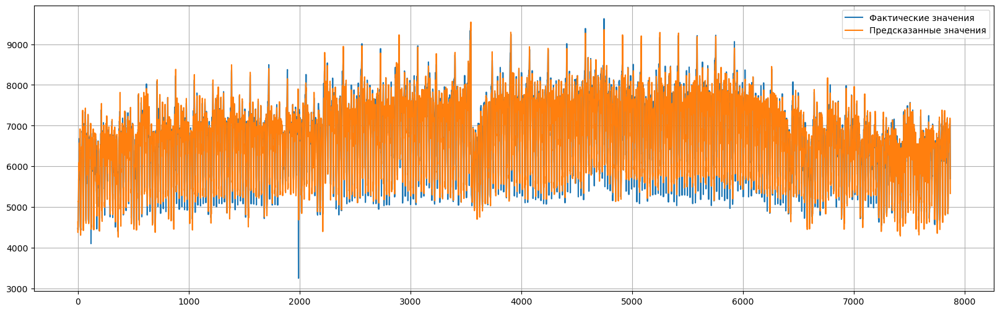

In [67]:
#Теперь можно обучить модель на обучающей выборке:

# Обучение модели
num_epochs = 50 #1000
batch_size = 32 #64


for epoch in range(num_epochs):
    model.train(True)
    for i in range(0, train_X.shape[0], batch_size):
        batch_X = train_X[i:i+batch_size]
        batch_y = train_y[i:i+batch_size]

        # Преобразование данных в тензоры PyTorch
        batch_X = torch.from_numpy(batch_X).float().unsqueeze(-1).to(device)
        batch_y = torch.from_numpy(batch_y).float().unsqueeze(-1).to(device)

        # Задание начальных значений скрытого состояния
        
        """Данные строки инициализируют начальные скрытое состояние h0 и состояние памяти c0 LSTM. 
        torch.zeros(num_layers, batch_X.size(0), hidden_size) - создает тензор из нулей размерности 
        (num_layers, batch_size, hidden_size), где 
        num_layers - количество слоев в LSTM, batch_size - размер батча, hidden_size - размерность скрытого состояния.
        .to(device) - переносит тензор на устройство (CPU или GPU), указанное в переменной device.
        .squeeze() - удаляет размерность с единичным значением из тензора.
        Таким образом, эти строки создают начальные скрытое состояние и состояние памяти LSTM, 
        которые будут использоваться при применении слоя LSTM к входному тензору."""
        
        h0 = torch.zeros(num_layers, batch_X.size(0), hidden_size).to(device)
        c0 = torch.zeros(num_layers, batch_X.size(0), hidden_size).to(device)
        h0 = h0.squeeze().to(device)
        c0 = c0.squeeze().to(device)

        # Прямой проход
        outputs = model(batch_X, h0, c0)
        loss = criterion(outputs, batch_y)

        # Обратный проход и оптимизация
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Вывод значения функции потерь на каждой эпохе
    if (epoch+1) % 10 == 0: #if (epoch+1) % 100 == 0:
        print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))


#После обучения модели можно сделать предсказания на тестовой выборке:


# Сделать предсказания на тестовой выборке
model.eval()
with torch.no_grad():
    test_X = torch.from_numpy(test_X).float().unsqueeze(-1).to(device)
    h0 = torch.zeros(num_layers, test_X.size(0), hidden_size).to(device)
    c0 = torch.zeros(num_layers, test_X.size(0), hidden_size).to(device)
    h0 = h0.squeeze()
    c0 = c0.squeeze()
    test_y_pred = model(test_X, h0, c0).cpu().numpy()

# Обратное преобразование нормализованных данных
test_y_pred = test_y_pred * std + mean
test_y = test_y * std + mean


#И, наконец, можно построить график сравнения предсказанных и фактических значений:

df_ee_pred_hh = pd.concat([pd.DataFrame(data = test_y), pd.DataFrame(test_y_pred)], axis = 1)[:]
df_ee_pred_hh.columns = ['Фактические значения', 'Предсказанные значения']
df_ee_pred_hh.plot(figsize = (20,6), grid = True)

In [68]:
#Проверяю бизнес-метрики на тестовой выборке

In [69]:
df_ee_pred_hh.columns = ['test_y', 'test_y_pred']

df_ee_test_hh = df_ee.tail(7872).copy() #7872 - как число элементов в тестовой выборке соотносится с дата временем прогнозирования?
df_ee_test_hh = df_ee_test_hh.reset_index()

In [70]:
df_ee_test_hh['Дата время'] = df_ee_test_hh['Дата время (мск)']

In [71]:
df_ee_test_hh = pd.concat([df_ee_test_hh, df_ee_pred_hh], axis = 1)[pd.concat([df_ee_test_hh, df_ee_pred_hh], axis = 1)['Дата время'] >= '2023-01-01 00:00:00']

df_ee_test_hh['abs'] = np.abs(df_ee_test_hh['test_y_pred'] - df_ee_test_hh['ГТП_ВС'])
df_ee_test_hh['abs_%'] = df_ee_test_hh['abs'] / df_ee_test_hh['test_y_pred']

In [72]:
df_ee_test_hh.groupby(df_ee_test_hh['Дата время'].dt.month)['abs_%'].mean()

Дата время
1    0.033606
2    0.037381
3    0.040267
4    0.040356
5    0.035163
6    0.035284
Name: abs_%, dtype: float64

In [73]:
df_ee_base_BM['ГТП_ВС_БМ']

месяц
1    0.056499
2    0.038146
3    0.035011
4    0.030568
5    0.051436
6    0.063498
Name: ГТП_ВС_БМ, dtype: float64

In [74]:
df_vivod = pd.concat([df_ee_test_hh.groupby(df_ee_test_hh['Дата время'].dt.month)['abs_%'].mean(), df_ee_base_BM['ГТП_ВС_БМ']], axis=1)
df_vivod.columns = ['ИИ-модель', 'base-модель']
df_vivod['откл'] = df_vivod['ИИ-модель'] - df_vivod['base-модель']
df_vivod

,ИИ-модель,base-модель,откл
1,0.033606,0.056499,-0.022893
2,0.037381,0.038146,-0.000766
3,0.040267,0.035011,0.005256
4,0.040356,0.030568,0.009787
5,0.035163,0.051436,-0.016273
6,0.035284,0.063498,-0.028214


# Вывод:
1. Для прогнозирования почасвого потребления электрической энергии можно использовать искуственные нейросети
2. Для ГТП_ВС на тесте ИИ-модель показала себя лучше в зимние и летние месяцы.

До защиты успеть ГТП_ВО